In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings
warnings.filterwarnings('ignore')

In [2]:
url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00242/ENB2012_data.xlsx'
df = pd.read_excel(url)

In [3]:
df

,X1,X2,X3,X4,X5,X6,X7,X8,Y1,Y2
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28
...,...,...,...,...,...,...,...,...,...,...
763,0.64,784.0,343.0,220.50,3.5,5,0.4,5,17.88,21.40
764,0.62,808.5,367.5,220.50,3.5,2,0.4,5,16.54,16.88
765,0.62,808.5,367.5,220.50,3.5,3,0.4,5,16.44,17.11
766,0.62,808.5,367.5,220.50,3.5,4,0.4,5,16.48,16.61


In [4]:
# Rename columns for convenience
df.columns = ['Relative_Compactness', 'Surface_Area', 'Wall_Area', 'Roof_Area', 'Overall_Height',
                'Orientation', 'Glazing_Area', 'Glazing_Area_Distribution', 'Heating_Load', 'Cooling_Load']


In [5]:
df

,Relative_Compactness,Surface_Area,Wall_Area,Roof_Area,Overall_Height,Orientation,Glazing_Area,Glazing_Area_Distribution,Heating_Load,Cooling_Load
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0,15.55,21.33
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0,15.55,21.33
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0,15.55,21.33
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0,15.55,21.33
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0,20.84,28.28
...,...,...,...,...,...,...,...,...,...,...
763,0.64,784.0,343.0,220.50,3.5,5,0.4,5,17.88,21.40
764,0.62,808.5,367.5,220.50,3.5,2,0.4,5,16.54,16.88
765,0.62,808.5,367.5,220.50,3.5,3,0.4,5,16.44,17.11
766,0.62,808.5,367.5,220.50,3.5,4,0.4,5,16.48,16.61


In [6]:
df.shape

(768, 10)

In [7]:
df.size

7680

In [8]:
df.columns.to_list()

['Relative_Compactness',
 'Surface_Area',
 'Wall_Area',
 'Roof_Area',
 'Overall_Height',
 'Orientation',
 'Glazing_Area',
 'Glazing_Area_Distribution',
 'Heating_Load',
 'Cooling_Load']

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Relative_Compactness       768 non-null    float64
 1   Surface_Area               768 non-null    float64
 2   Wall_Area                  768 non-null    float64
 3   Roof_Area                  768 non-null    float64
 4   Overall_Height             768 non-null    float64
 5   Orientation                768 non-null    int64  
 6   Glazing_Area               768 non-null    float64
 7   Glazing_Area_Distribution  768 non-null    int64  
 8   Heating_Load               768 non-null    float64
 9   Cooling_Load               768 non-null    float64
dtypes: float64(8), int64(2)
memory usage: 60.1 KB


In [10]:
df.isna().sum()

Relative_Compactness         0
Surface_Area                 0
Wall_Area                    0
Roof_Area                    0
Overall_Height               0
Orientation                  0
Glazing_Area                 0
Glazing_Area_Distribution    0
Heating_Load                 0
Cooling_Load                 0
dtype: int64

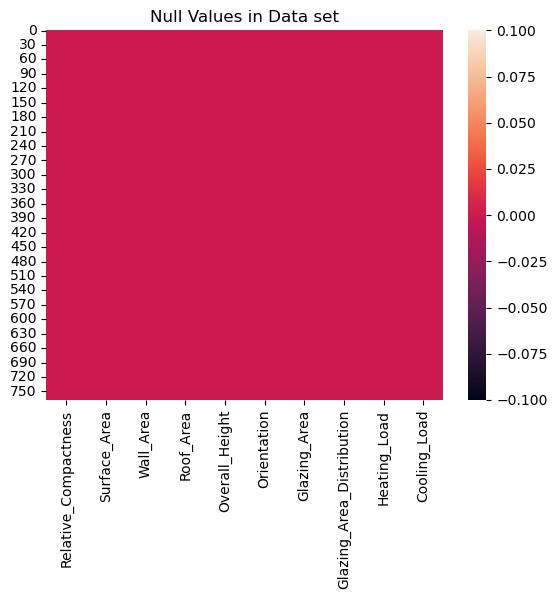

In [11]:
sns.heatmap(df.isna())
plt.title('Null Values in Data set')
plt.show()

In [12]:
for i in df.columns:
    print(df[i].value_counts())
    print('\n')

Relative_Compactness
0.98    64
0.90    64
0.86    64
0.82    64
0.79    64
0.76    64
0.74    64
0.71    64
0.69    64
0.66    64
0.64    64
0.62    64
Name: count, dtype: int64


Surface_Area
514.5    64
563.5    64
588.0    64
612.5    64
637.0    64
661.5    64
686.0    64
710.5    64
735.0    64
759.5    64
784.0    64
808.5    64
Name: count, dtype: int64


Wall_Area
294.0    192
318.5    192
343.0    128
416.5     64
245.0     64
269.5     64
367.5     64
Name: count, dtype: int64


Roof_Area
220.50    384
147.00    192
122.50    128
110.25     64
Name: count, dtype: int64


Overall_Height
7.0    384
3.5    384
Name: count, dtype: int64


Orientation
2    192
3    192
4    192
5    192
Name: count, dtype: int64


Glazing_Area
0.10    240
0.25    240
0.40    240
0.00     48
Name: count, dtype: int64


Glazing_Area_Distribution
1    144
2    144
3    144
4    144
5    144
0     48
Name: count, dtype: int64


Heating_Load
15.16    6
13.00    5
15.23    4
28.15    4
14.60    4
     

In [13]:
from ydata_profiling import ProfileReport

In [14]:
profile = ProfileReport(df,explorative=True,orange_mode=True)
profile.to_notebook_iframe()
profile.to_file('Energy Efficiency.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

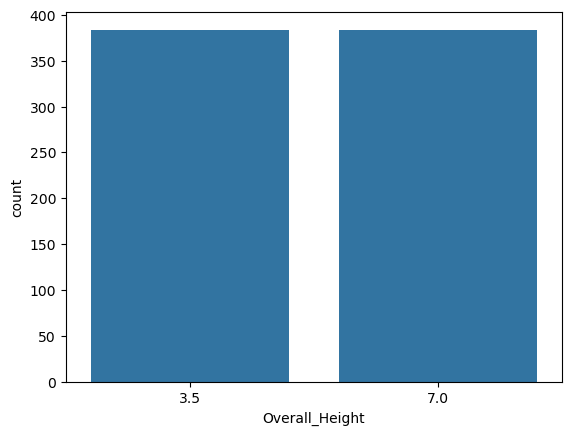

In [15]:
sns.countplot(df,x='Overall_Height')
plt.show()

In [16]:
catg_features=[col for col in df.columns if df[col].dtypes=='object']
cont_features=[col for col in df.columns if df[col].dtypes!='object']

In [17]:
print('Number of catg features :- ',len(catg_features))
print('Number of continious features :- ',len(cont_features))

Number of catg features :-  0
Number of continious features :-  10


In [18]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Relative_Compactness,768.0,0.764167,0.105777,0.62,0.6825,0.75,0.8300,0.98
Surface_Area,768.0,671.708333,88.086116,514.50,606.3750,673.75,741.1250,808.50
Wall_Area,768.0,318.500000,43.626481,245.00,294.0000,318.50,343.0000,416.50
Roof_Area,768.0,176.604167,45.165950,110.25,140.8750,183.75,220.5000,220.50
Overall_Height,768.0,5.250000,1.751140,3.50,3.5000,5.25,7.0000,7.00
Orientation,768.0,3.500000,1.118763,2.00,2.7500,3.50,4.2500,5.00
Glazing_Area,768.0,0.234375,0.133221,0.00,0.1000,0.25,0.4000,0.40
Glazing_Area_Distribution,768.0,2.812500,1.550960,0.00,1.7500,3.00,4.0000,5.00
Heating_Load,768.0,22.307195,10.090204,6.01,12.9925,18.95,31.6675,43.10
Cooling_Load,768.0,24.587760,9.513306,10.90,15.6200,22.08,33.1325,48.03


In [19]:
df.corr().T

,Relative_Compactness,Surface_Area,Wall_Area,Roof_Area,Overall_Height,Orientation,Glazing_Area,Glazing_Area_Distribution,Heating_Load,Cooling_Load
Relative_Compactness,1.000000e+00,-9.919015e-01,-2.037817e-01,-8.688234e-01,8.277473e-01,4.678592e-17,-2.960552e-15,-7.107006e-16,0.622272,0.634339
Surface_Area,-9.919015e-01,1.000000e+00,1.955016e-01,8.807195e-01,-8.581477e-01,-3.459372e-17,3.636925e-15,2.438409e-15,-0.658120,-0.672999
Wall_Area,-2.037817e-01,1.955016e-01,1.000000e+00,-2.923165e-01,2.809757e-01,-2.429499e-17,-8.567455e-17,2.067384e-16,0.455671,0.427117
Roof_Area,-8.688234e-01,8.807195e-01,-2.923165e-01,1.000000e+00,-9.725122e-01,-5.830058e-17,-1.759011e-15,-1.078071e-15,-0.861828,-0.862547
Overall_Height,8.277473e-01,-8.581477e-01,2.809757e-01,-9.725122e-01,1.000000e+00,4.492205e-17,1.489134e-17,-2.920613e-17,0.889430,0.895785
Orientation,4.678592e-17,-3.459372e-17,-2.429499e-17,-5.830058e-17,4.492205e-17,1.000000e+00,-9.406007e-16,-2.549352e-16,-0.002587,0.014290
Glazing_Area,-2.960552e-15,3.636925e-15,-8.567455e-17,-1.759011e-15,1.489134e-17,-9.406007e-16,1.000000e+00,2.129642e-01,0.269842,0.207505
Glazing_Area_Distribution,-7.107006e-16,2.438409e-15,2.067384e-16,-1.078071e-15,-2.920613e-17,-2.549352e-16,2.129642e-01,1.000000e+00,0.087368,0.050525
Heating_Load,6.222719e-01,-6.581199e-01,4.556714e-01,-8.618281e-01,8.894305e-01,-2.586763e-03,2.698417e-01,8.736846e-02,1.000000,0.975862
Cooling_Load,6.343391e-01,-6.729989e-01,4.271170e-01,-8.625466e-01,8.957852e-01,1.428960e-02,2.075050e-01,5.052512e-02,0.975862,1.000000


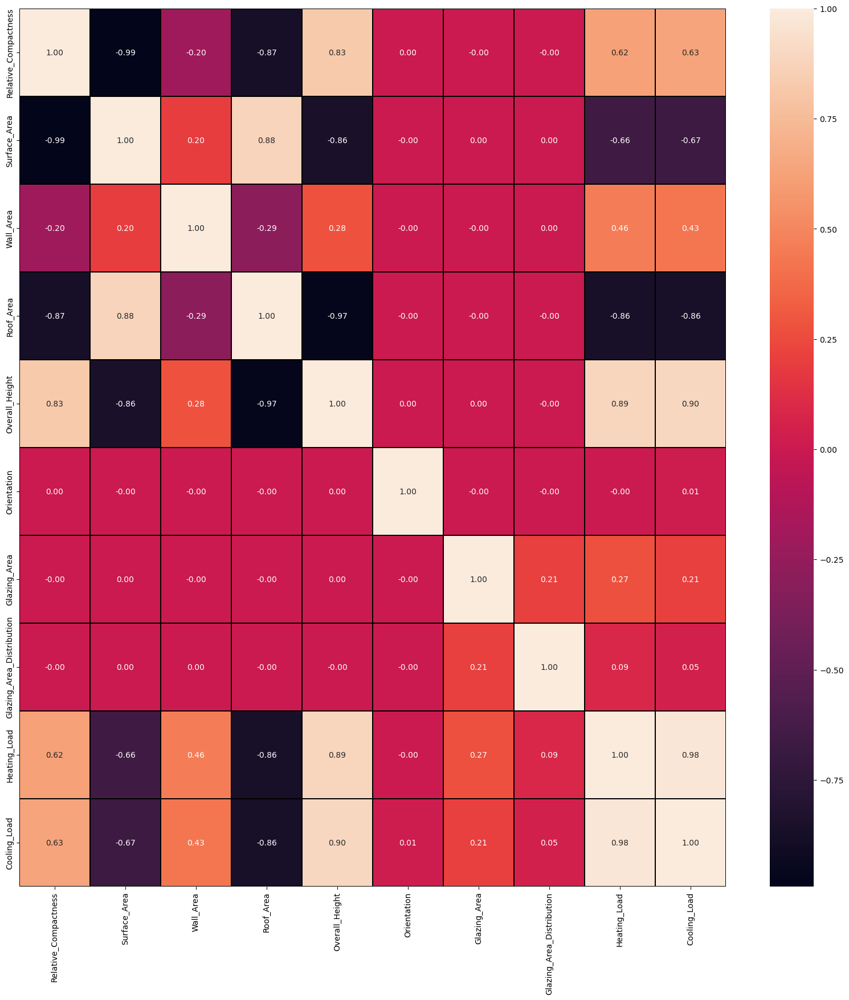

In [20]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),annot=True,linewidths=0.1,linecolor='black',fmt='0.2f')
plt.show()

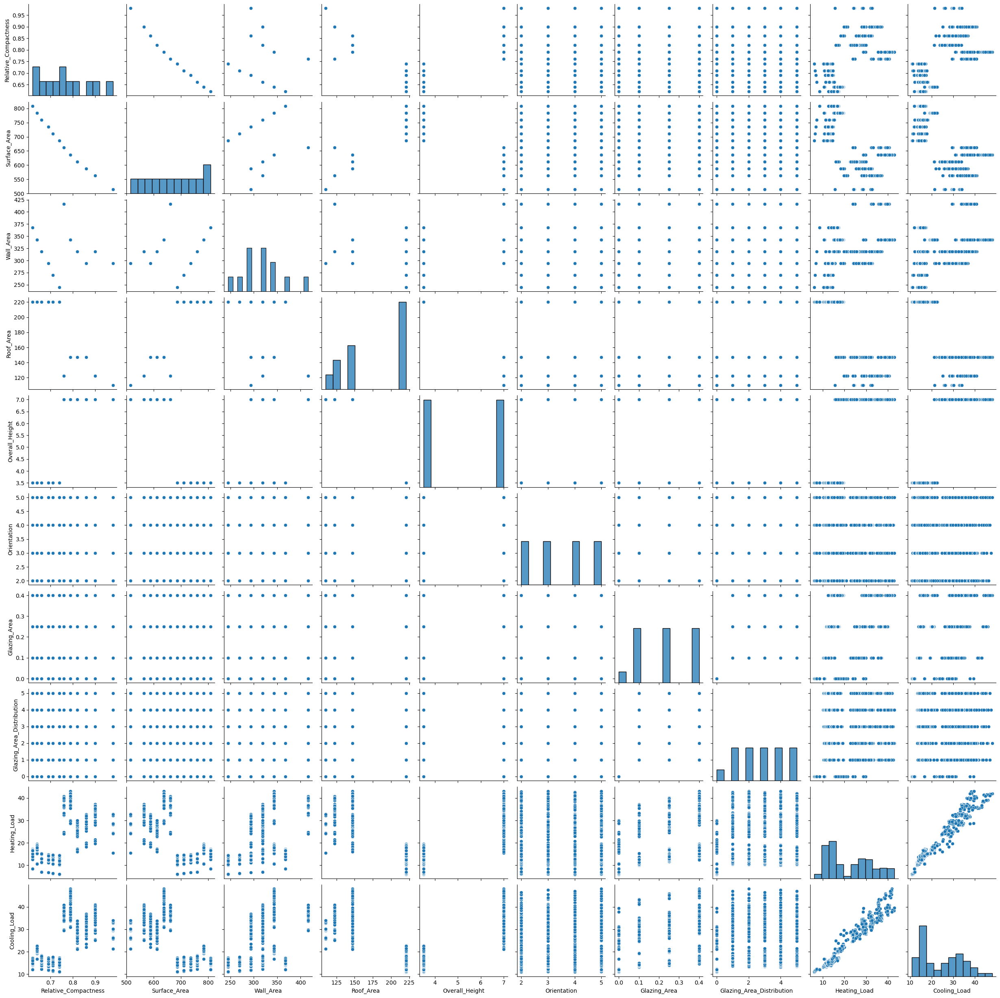

In [21]:
sns.pairplot(df)

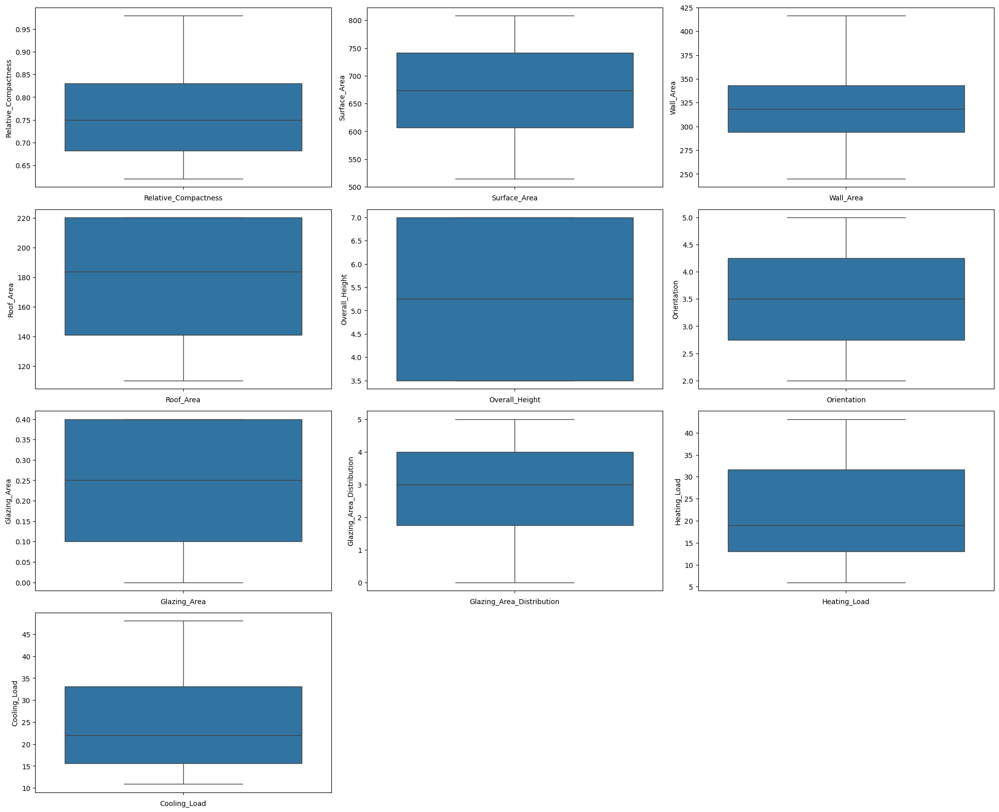

In [22]:
plt.figure(figsize=(20,20))
plotnumber = 1
for column in cont_features:
    if plotnumber<=10:
        ax= plt.subplot(5,3,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column)
    
    plotnumber+=1
plt.tight_layout()

<Axes: >

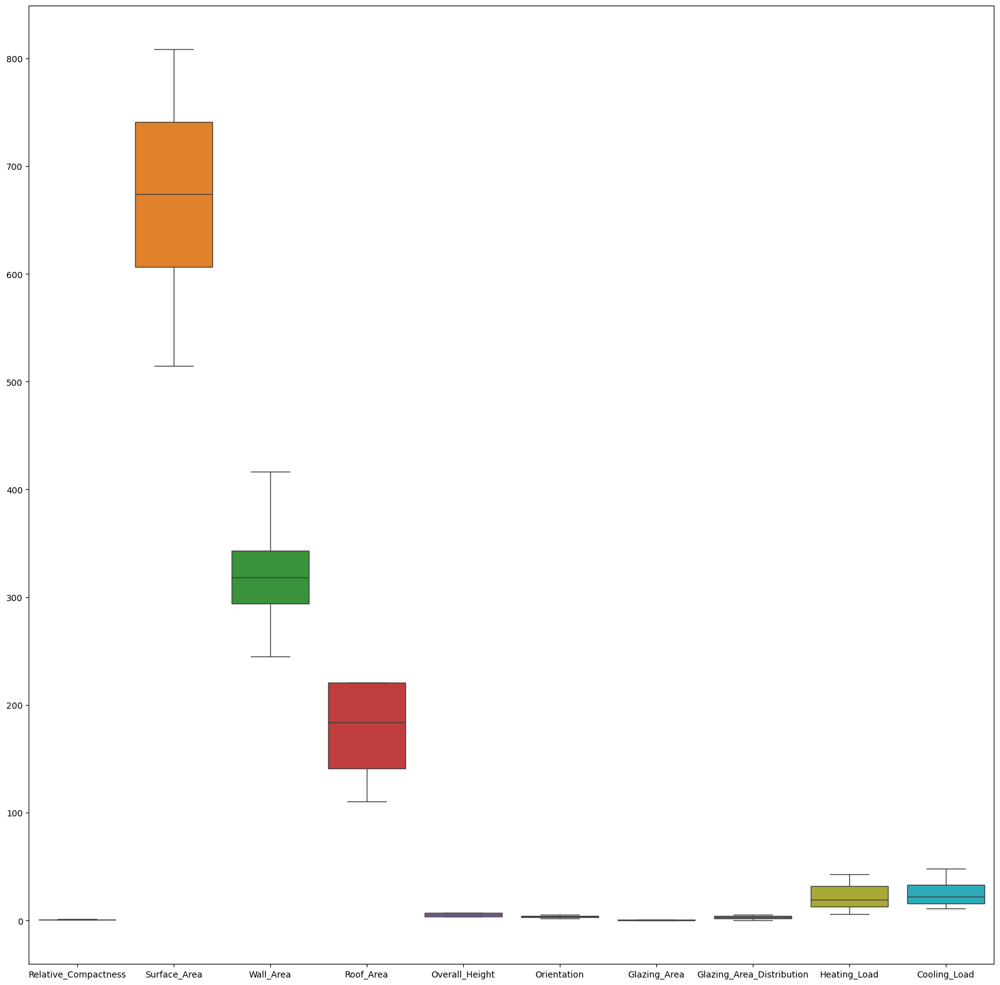

In [23]:
plt.figure(figsize=(20,20))
sns.boxplot(df)

In [24]:
df.skew()

Relative_Compactness         0.495513
Surface_Area                -0.125131
Wall_Area                    0.533417
Roof_Area                   -0.162764
Overall_Height               0.000000
Orientation                  0.000000
Glazing_Area                -0.060254
Glazing_Area_Distribution   -0.088689
Heating_Load                 0.360446
Cooling_Load                 0.395992
dtype: float64

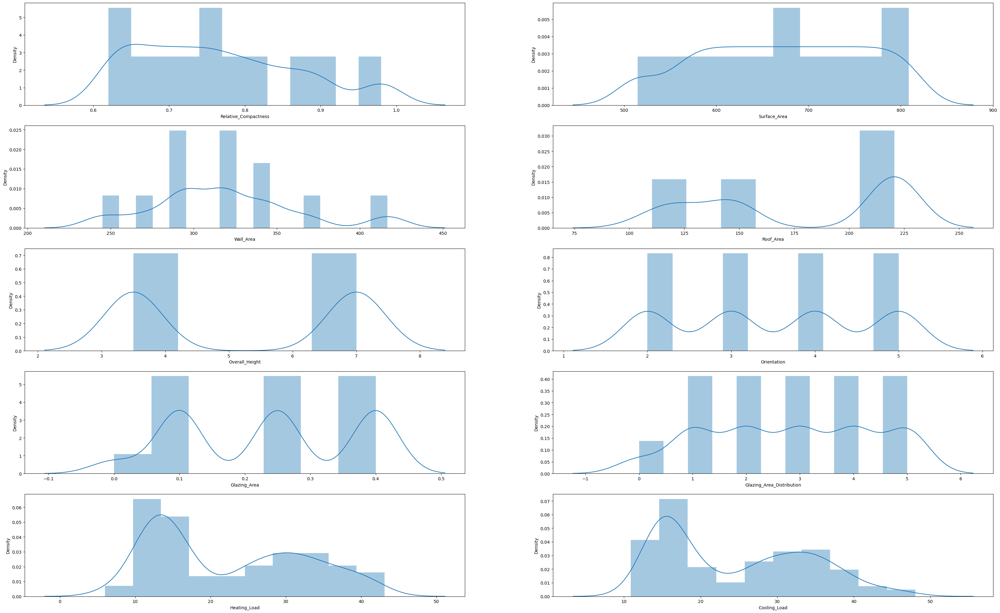

In [25]:
plt.figure(figsize=(40,40))
for i in enumerate(df):
    plt.subplot(8,2,i[0]+1)
    sns.distplot(df[i[1]])
plt.show()

In [26]:
# Features and target variables
X = df.iloc[:, :-2]
y1 = df['Heating_Load']
y2 = df['Cooling_Load']


In [27]:
X

,Relative_Compactness,Surface_Area,Wall_Area,Roof_Area,Overall_Height,Orientation,Glazing_Area,Glazing_Area_Distribution
0,0.98,514.5,294.0,110.25,7.0,2,0.0,0
1,0.98,514.5,294.0,110.25,7.0,3,0.0,0
2,0.98,514.5,294.0,110.25,7.0,4,0.0,0
3,0.98,514.5,294.0,110.25,7.0,5,0.0,0
4,0.90,563.5,318.5,122.50,7.0,2,0.0,0
...,...,...,...,...,...,...,...,...
763,0.64,784.0,343.0,220.50,3.5,5,0.4,5
764,0.62,808.5,367.5,220.50,3.5,2,0.4,5
765,0.62,808.5,367.5,220.50,3.5,3,0.4,5
766,0.62,808.5,367.5,220.50,3.5,4,0.4,5


In [28]:
y1.to_list()

[15.55,
 15.55,
 15.55,
 15.55,
 20.84,
 21.46,
 20.71,
 19.68,
 19.5,
 19.95,
 19.34,
 18.31,
 17.05,
 17.41,
 16.95,
 15.98,
 28.52,
 29.9,
 29.63,
 28.75,
 24.77,
 23.93,
 24.77,
 23.93,
 6.07,
 6.05,
 6.01,
 6.04,
 6.37,
 6.4,
 6.366,
 6.4,
 6.85,
 6.79,
 6.77,
 6.81,
 7.18,
 7.1,
 7.1,
 7.1,
 10.85,
 10.54,
 10.77,
 10.56,
 8.6,
 8.49,
 8.45,
 8.5,
 24.58,
 24.63,
 24.63,
 24.59,
 29.03,
 29.87,
 29.14,
 28.09,
 26.28,
 26.91,
 26.37,
 25.27,
 23.53,
 24.03,
 23.54,
 22.58,
 35.56,
 37.12,
 36.9,
 35.94,
 32.96,
 32.12,
 32.94,
 32.21,
 10.36,
 10.43,
 10.36,
 10.39,
 10.71,
 10.8,
 10.7,
 10.75,
 11.11,
 11.13,
 11.09,
 11.16,
 11.68,
 11.69,
 11.7,
 11.69,
 15.41,
 15.2,
 15.42,
 15.21,
 12.96,
 12.97,
 12.93,
 13.02,
 24.29,
 24.31,
 24.13,
 24.25,
 28.88,
 29.68,
 28.83,
 27.9,
 26.48,
 27.02,
 26.33,
 25.36,
 23.75,
 24.23,
 23.67,
 22.79,
 35.65,
 37.26,
 36.97,
 36.03,
 33.16,
 32.4,
 33.12,
 32.41,
 10.42,
 10.46,
 10.32,
 10.45,
 10.64,
 10.72,
 10.55,
 10.68,
 11.45,
 11

In [29]:
y2.to_list()

[21.33,
 21.33,
 21.33,
 21.33,
 28.28,
 25.38,
 25.16,
 29.6,
 27.3,
 21.97,
 23.49,
 27.87,
 23.77,
 21.46,
 21.16,
 24.93,
 37.73,
 31.27,
 30.93,
 39.44,
 29.79,
 29.68,
 29.79,
 29.4,
 10.9,
 11.19,
 10.94,
 11.17,
 11.27,
 11.72,
 11.29,
 11.67,
 11.74,
 12.05,
 11.73,
 11.93,
 12.4,
 12.23,
 12.4,
 12.14,
 16.78,
 16.8,
 16.75,
 16.67,
 12.07,
 12.22,
 12.08,
 12.04,
 26.47,
 26.37,
 26.44,
 26.29,
 32.92,
 29.87,
 29.58,
 34.33,
 30.89,
 25.6,
 27.03,
 31.73,
 27.31,
 24.91,
 24.61,
 28.51,
 41.68,
 35.28,
 34.43,
 43.33,
 33.87,
 34.07,
 34.14,
 33.67,
 13.43,
 13.71,
 13.48,
 13.7,
 13.8,
 14.28,
 13.87,
 14.27,
 14.28,
 14.61,
 14.3,
 14.45,
 13.9,
 13.72,
 13.88,
 13.65,
 19.37,
 19.43,
 19.34,
 19.32,
 14.34,
 14.5,
 14.33,
 14.27,
 25.95,
 25.63,
 26.13,
 25.89,
 32.54,
 29.44,
 29.36,
 34.2,
 30.91,
 25.63,
 27.36,
 31.9,
 27.38,
 25.02,
 24.8,
 28.79,
 41.07,
 34.62,
 33.87,
 42.86,
 33.91,
 34.07,
 34.17,
 33.78,
 13.39,
 13.72,
 13.57,
 13.79,
 13.67,
 14.11,
 13.8,
 

In [30]:
from sklearn.preprocessing import MinMaxScaler
sc=MinMaxScaler()
X=sc.fit_transform(X)

In [31]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Relative_Compactness,768.0,0.764167,0.105777,0.62,0.6825,0.75,0.8300,0.98
Surface_Area,768.0,671.708333,88.086116,514.50,606.3750,673.75,741.1250,808.50
Wall_Area,768.0,318.500000,43.626481,245.00,294.0000,318.50,343.0000,416.50
Roof_Area,768.0,176.604167,45.165950,110.25,140.8750,183.75,220.5000,220.50
Overall_Height,768.0,5.250000,1.751140,3.50,3.5000,5.25,7.0000,7.00
Orientation,768.0,3.500000,1.118763,2.00,2.7500,3.50,4.2500,5.00
Glazing_Area,768.0,0.234375,0.133221,0.00,0.1000,0.25,0.4000,0.40
Glazing_Area_Distribution,768.0,2.812500,1.550960,0.00,1.7500,3.00,4.0000,5.00
Heating_Load,768.0,22.307195,10.090204,6.01,12.9925,18.95,31.6675,43.10
Cooling_Load,768.0,24.587760,9.513306,10.90,15.6200,22.08,33.1325,48.03


In [32]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score

## CHECKING THE BEST RANDOM STATE FOR DATA SPLIT (Heating)

In [33]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
maxR2_Score=0
maxRS=0
for i in range(1,1000):
    X_train,X_test,y1_train,y1_test = train_test_split(X,y1,test_size=.30,random_state=i)
    LR = LinearRegression()
    LR.fit(X_train, y1_train)
    predrf = LR.predict(X_test)
    score = r2_score(y1_test, predrf)
    if score>maxR2_Score:
        maxR2_Score=score
        maxRS=i
print("Best accuracy is",maxR2_Score," on Random_state ",maxRS)

Best accuracy is 0.9355278272198827  on Random_state  363


In [34]:
# spliting data 70% for train and 30% for test
X_train,X_test,y1_train,y1_test=train_test_split(X,y1,test_size=.35,random_state=maxRS)

In [35]:
# import all algorithms 

from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.model_selection import cross_val_score,GridSearchCV
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor,AdaBoostRegressor,BaggingRegressor,GradientBoostingRegressor
from sklearn.linear_model import Ridge,Lasso,LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor,ExtraTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRFRegressor
import plotly.graph_objects as go

In [36]:
model = [RandomForestRegressor(),ExtraTreesRegressor(),AdaBoostRegressor(),BaggingRegressor(),GradientBoostingRegressor(),
        Ridge(),Lasso(),LinearRegression(),SVR(),DecisionTreeRegressor(),ExtraTreeRegressor(),KNeighborsRegressor(),XGBRFRegressor()]

for m in model:
    print("*******************************************************************************")
    print("===============================================================================")
    print('accuracy score of :', m)
    m.fit(X_train,y1_train)
    pred = m.predict(X_test)
    print("R2 Score:                ", r2_score(y1_test,pred)*100)
    print("Mean Absolute Error:     ", mean_absolute_error(y1_test,pred)*100)
    print("Mean Squared error:      ", mean_squared_error(y1_test,pred)*100)
    print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y1_test,pred)*100))
    score=cross_val_score(m,X,y1,cv=8)
    print(score)
    print("cross validation score:  ",score.mean())
    print("Difference between R2 score and cross validatio score is :  ",r2_score(y1_test,pred)-abs(score.mean()*100))


        # Gauge meter
    metric_value = r2_score(y1_test,pred)*100
    fig = go.Figure(go.Indicator(
    mode="gauge+number",
    value=metric_value,
    title={'text': "Model Accuracy (%)"},
    gauge={
        'axis': {'range': [0, 100]},
        'bar': {'color': "darkblue"},
        'steps': [
            {'range': [0, 50], 'color': "red"},
            {'range': [50, 80], 'color': "yellow"},
            {'range': [80, 100], 'color': "green"}
        ],
    }
    ))

# Display the gauge
    fig.show()
    print("===============================================================================")
    print("*******************************************************************************")

*******************************************************************************
accuracy score of : RandomForestRegressor()
R2 Score:                 99.65573939260008
Mean Absolute Error:      38.201003717471956
Mean Squared error:       34.161849631970185
Root Mean Squared Error:  5.844813909096695
[0.74422947 0.99816418 0.99553155 0.99558337 0.99718087 0.997991
 0.99712385 0.9954953 ]
cross validation score:   0.9651624487748581
Difference between R2 score and cross validatio score is :   -95.51968748355982


*******************************************************************************
*******************************************************************************
accuracy score of : ExtraTreesRegressor()
R2 Score:                 99.68363082630005
Mean Absolute Error:      35.96832713754641
Mean Squared error:       31.39411221561333
Root Mean Squared Error:  5.6030449057287885
[0.7451031  0.99830041 0.99443883 0.99469458 0.99740201 0.99779936
 0.9966179  0.99475273]
cross validation score:   0.964888614194789
Difference between R2 score and cross validatio score is :   -95.4920251112159


*******************************************************************************
*******************************************************************************
accuracy score of : AdaBoostRegressor()
R2 Score:                 97.14291283394373
Mean Absolute Error:      136.52333387569985
Mean Squared error:       283.5159761362499
Root Mean Squared Error:  16.83793265624524
[0.64376632 0.9560532  0.95307365 0.97344565 0.97012127 0.95722075
 0.97188101 0.95885566]
cross validation score:   0.9230521882354565
Difference between R2 score and cross validatio score is :   -91.33378969520622


*******************************************************************************
*******************************************************************************
accuracy score of : BaggingRegressor()
R2 Score:                 99.672815134126
Mean Absolute Error:      37.43568773234203
Mean Squared error:       32.467380669145
Root Mean Squared Error:  5.698015502711887
[0.74153917 0.99800555 0.99533021 0.99581726 0.99689304 0.99786633
 0.99671213 0.99557549]
cross validation score:   0.964717396836946
Difference between R2 score and cross validatio score is :   -95.47501153235335


*******************************************************************************
*******************************************************************************
accuracy score of : GradientBoostingRegressor()
R2 Score:                 99.72796993224893
Mean Absolute Error:      34.21739881748086
Mean Squared error:       26.994230737213964
Root Mean Squared Error:  5.195597245477556
[0.71809074 0.99820361 0.99649099 0.99737293 0.99750216 0.99723696
 0.99801312 0.99636842]
cross validation score:   0.9624098650736723
Difference between R2 score and cross validatio score is :   -95.24370680804475


*******************************************************************************
*******************************************************************************
accuracy score of : Ridge()
R2 Score:                 91.71213268072353
Mean Absolute Error:      201.55454082193543
Mean Squared error:       822.426008218649
Root Mean Squared Error:  28.677970782791608
[0.72433231 0.89724992 0.90268775 0.91614929 0.91731131 0.9177289
 0.92564491 0.91740135]
cross validation score:   0.8898132164038703
Difference between R2 score and cross validatio score is :   -88.0642003135798


*******************************************************************************
*******************************************************************************
accuracy score of : Lasso()
R2 Score:                 75.29442893976568
Mean Absolute Error:      388.1304315024527
Mean Squared error:       2451.5962195211
Root Mean Squared Error:  49.51359630971174
[0.30560405 0.77134891 0.77065525 0.81364648 0.81411162 0.7508519
 0.69350802 0.70039923]
cross validation score:   0.7025156812977641
Difference between R2 score and cross validatio score is :   -69.49862384037876


*******************************************************************************
*******************************************************************************
accuracy score of : LinearRegression()
R2 Score:                 92.00883837884227
Mean Absolute Error:      198.137407063197
Mean Squared error:       792.983152352463
Root Mean Squared Error:  28.159956540315594
[0.73134075 0.89910958 0.90457363 0.91840074 0.91922375 0.92010802
 0.92664646 0.91719265]
cross validation score:   0.8920744482403069
Difference between R2 score and cross validatio score is :   -88.28735644024226


*******************************************************************************
*******************************************************************************
accuracy score of : SVR()
R2 Score:                 92.58571527774266
Mean Absolute Error:      184.75514860639245
Mean Squared error:       735.7382005549451
Root Mean Squared Error:  27.124494475564795
[0.69028343 0.91975506 0.91583149 0.93183631 0.9180962  0.91938672
 0.93682149 0.90017346]
cross validation score:   0.8915230189360154
Difference between R2 score and cross validatio score is :   -88.2264447408241


*******************************************************************************
*******************************************************************************
accuracy score of : DecisionTreeRegressor()
R2 Score:                 99.52422005103897
Mean Absolute Error:      44.47360594795539
Mean Squared error:       47.212846096654275
Root Mean Squared Error:  6.871160462152974
[0.7451031  0.9977631  0.99443883 0.99484376 0.99682637 0.99779949
 0.9961659  0.99475368]
cross validation score:   0.9647117779032035
Difference between R2 score and cross validatio score is :   -95.47593558980996


*******************************************************************************
*******************************************************************************
accuracy score of : ExtraTreeRegressor()
R2 Score:                 99.61301191453728
Mean Absolute Error:      40.77472118959109
Mean Squared error:       38.40180520446097
Root Mean Squared Error:  6.196919009028678
[0.7451031  0.99623717 0.99443883 0.99484376 0.99638533 0.99779949
 0.99507402 0.99475368]
cross validation score:   0.9643294219286737
Difference between R2 score and cross validatio score is :   -95.436812073722


*******************************************************************************
*******************************************************************************
accuracy score of : KNeighborsRegressor()
R2 Score:                 92.60295036107085
Mean Absolute Error:      183.8185873605948
Mean Squared error:       734.0279197026023
Root Mean Squared Error:  27.092949630902176
[0.70395478 0.97607508 0.94792099 0.96237621 0.97425223 0.97482502
 0.98241461 0.95440347]
cross validation score:   0.9345277973908
Difference between R2 score and cross validatio score is :   -92.5267502354693


*******************************************************************************
*******************************************************************************
accuracy score of : XGBRFRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bytree=None, device=None,
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=None,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=None, n_jobs=None,
               num_parallel_tree=None, objective='reg:squarederror',
               random_state=None, reg_alpha=None, ...)
R2 Score:                 99.6008

*******************************************************************************


In [37]:
GBr_moedel = GradientBoostingRegressor()

In [38]:
GBr_moedel.get_params()

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [39]:
#import the randomized search CV
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
parameter = {"max_depth": randint(1,10),
    "max_features": ["sqrt", "log2", None],
    'random_state':randint(50,300),
    "min_samples_leaf": randint(1, 9),
    'n_estimators':randint(10,100),
    "criterion": ["squared_error", "absolute_error", "friedman_mse", "poisson"],
    'alpha': [0.9,0.8,0.10],
    'ccp_alpha': [0.0,0.1],
    'min_samples_split': randint(1,10)}

In [40]:
RSV = RandomizedSearchCV(GBr_moedel,parameter,cv=5)
RSV.fit(X_train,y1_train)

RandomizedSearchCV(cv=5, estimator=GradientBoostingRegressor(),
                   param_distributions={'alpha': [0.9, 0.8, 0.1],
                                        'ccp_alpha': [0.0, 0.1],
                                        'criterion': ['squared_error',
                                                      'absolute_error',
                                                      'friedman_mse',
                                                      'poisson'],
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x0000017905F258B0>,
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': <sc...structure.rv_discrete_frozen object at 0x0000017905DD21B0>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000179077B7AA0>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x00000179077B6840>,
                                        'random_state': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000001790616DDC0>})

In [41]:
RSV.best_params_

{'alpha': 0.8,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': 2,
 'max_features': None,
 'min_samples_leaf': 5,
 'min_samples_split': 7,
 'n_estimators': 83,
 'random_state': 54}

In [42]:
Predict = RSV.best_estimator_.predict(X_test)

In [43]:
print(r2_score(y1_test,Predict)*100)

99.45023709456405


In [44]:
metric_value = r2_score(y1_test,Predict)*100

# Create the gauge meter
fig = go.Figure(go.Indicator(
    mode="gauge+number",
    value=metric_value,
    title={'text': "Model Accuracy for Heating (%)"},
    gauge={
        'axis': {'range': [0, 100]},
        'bar': {'color': "darkblue"},
        'steps': [
            {'range': [0, 50], 'color': "red"},
            {'range': [50, 80], 'color': "yellow"},
            {'range': [80, 100], 'color': "green"}
        ],
    }
))

# Display the gauge
fig.show()

In [45]:
# Save model 
import joblib
joblib.dump(RSV.best_estimator_,"Heating.obj")
GB_from_joblib=joblib.load('Heating.obj')
Predicted = GB_from_joblib.predict(X_test)
Predicted

array([26.28308008, 24.66789739, 16.55881981, 41.3221426 , 18.49083937,
       24.62054739, 14.32362141, 28.96879947, 14.32362141, 14.32362141,
       10.93311298, 29.18907273, 34.77195352, 14.32362141, 28.18265606,
       14.32362141, 38.67850546, 24.62054739, 34.77195352, 15.10927314,
       26.28308008, 12.53688513, 31.78069598, 12.58821898, 36.29355781,
       15.10927314, 15.10927314, 12.58821898, 31.78069598, 29.18907273,
       34.77195352, 16.55881981, 18.49083937, 39.56046516, 14.32362141,
       12.53688513, 31.42176044, 14.933682  , 14.32362141, 10.25561765,
       24.66789739, 39.56046516, 39.56046516, 12.53688513, 14.32362141,
       28.18265606, 16.99149668, 32.83922236, 17.06802721, 34.77195352,
       16.99149668, 24.38854912, 18.49083937, 26.28308008, 12.58821898,
       32.82209077, 12.58821898, 32.83922236, 24.38854912, 11.30948915,
       10.93311298, 21.18311271, 36.29355781, 14.32362141, 12.53688513,
       35.92673829, 14.32362141, 10.93311298, 41.3221426 , 10.93

In [46]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
pd.DataFrame([GB_from_joblib.predict(X_test)[:],y1_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268
Predicted,26.28308,24.667897,16.55882,41.322143,18.490839,24.620547,14.323621,28.968799,14.323621,14.323621,10.933113,29.189073,34.771954,14.323621,28.182656,14.323621,38.678505,24.620547,34.771954,15.109273,26.28308,12.536885,31.780696,12.588219,36.293558,15.109273,15.109273,12.588219,31.780696,29.189073,34.771954,16.55882,18.490839,39.560465,14.323621,12.536885,31.42176,14.933682,14.323621,10.255618,24.667897,39.560465,39.560465,12.536885,14.323621,28.182656,16.991497,32.839222,17.068027,34.771954,16.991497,24.388549,18.490839,26.28308,12.588219,32.822091,12.588219,32.839222,24.388549,11.309489,10.933113,21.183113,36.293558,14.323621,12.536885,35.926738,14.323621,10.933113,41.322143,10.933113,28.182656,12.536885,9.227273,12.536885,15.109273,29.189073,36.293558,28.968799,11.309489,28.182656,16.55882,41.322143,16.55882,19.551874,29.016149,24.388549,29.016149,32.822091,31.780696,10.933113,14.933682,14.510255,9.227273,24.667897,39.560465,15.109273,12.588219,31.42176,36.293558,39.560465,29.189073,29.016149,36.293558,10.933113,26.28308,6.172756,35.926738,34.771954,38.678505,9.227273,26.28308,34.771954,29.016149,6.172756,26.28308,14.933682,16.55882,28.182656,13.401536,29.016149,16.991497,34.771954,14.323621,32.822091,12.536885,10.933113,29.016149,25.997389,12.536885,39.560465,32.822091,12.588219,32.822091,34.771954,18.490839,10.255618,13.478066,31.780696,35.926738,12.536885,26.28308,13.401536,26.28308,14.323621,31.780696,41.322143,10.933113,10.933113,24.388549,10.255618,14.323621,31.42176,10.933113,14.323621,13.478066,28.182656,12.588219,13.478066,14.510255,12.536885,18.490839,14.323621,32.839222,36.293558,17.621004,29.189073,35.926738,12.536885,31.780696,17.657343,11.309489,18.490839,31.42176,12.588219,12.536885,38.678505,10.933113,14.323621,24.667897,17.068027,36.293558,10.933113,26.969499,12.536885,28.182656,29.353242,29.189073,39.560465,10.933113,10.933113,31.780696,31.42176,11.309489,28.968799,26.28308,24.388549,15.010213,32.839222,39.560465,29.696422,26.28308,29.696422,10.933113,14.323621,16.55882,17.068027,29.696422,10.933113,10.933113,11.309489,13.401536,29.189073,11.309489,15.010213,10.933113,10.933113,10.933113,6.549133,18.490839,35.926738,12.588219,6.172756,14.323621,15.010213,18.490839,36.293558,11.309489,12.588219,14.933682,14.510255,28.182656,26.28308,29.016149,13.478066,15.109273,18.490839,35.926738,10.933113,6.549133,14.323621,17.657343,29.696422,24.388549,14.510255,14.323621,14.323621,16.55882,10.933113,38.678505,12.536885,17.621004,38.678505,26.969499,13.401536,35.926738,29.189073,14.510255,34.771954,14.323621,26.28308,11.309489,35.926738,35.926738,24.388549,18.490839,21.183113,32.839222,14.933682,24.388549
Original,26.28000,24.350000,17.37000,40.790000,18.160000,24.630000,14.190000,28.410000,12.420000,13.780000,11.090000,29.090000,35.010000,14.620000,29.620000,14.530000,39.040000,24.580000,36.470000,15.190000,27.02000,12.720000,32.120000,12.840000,35.990000,15.360000,15.410000,12.740000,32.050000,29.600000,34.720000,16.86000,17.880000,40.780000,13.970000,12.340000,

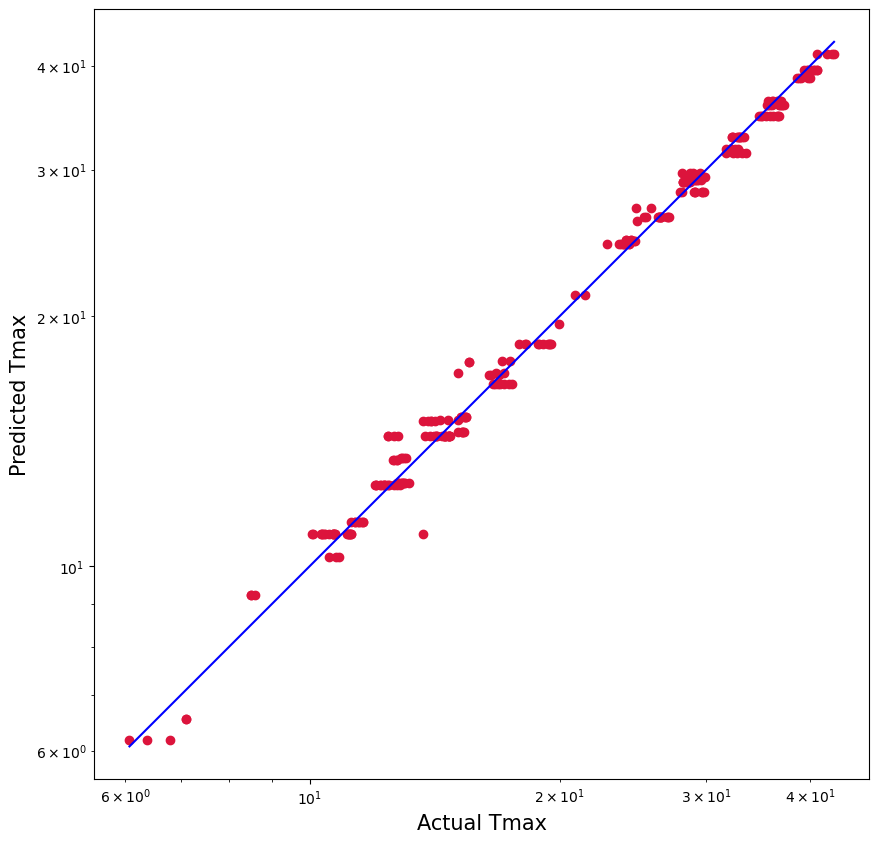

In [47]:
plt.figure(figsize=(10,10))
plt.scatter(y1_test, Predicted, c='crimson')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(Predicted), max(y1_test))
p2 = min(min(Predicted), min(y1_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual Tmax', fontsize=15)
plt.ylabel('Predicted Tmax', fontsize=15)
plt.axis('equal')
plt.show()

#

#

## CHECKING THE BEST RANDOM STATE FOR DATA SPLIT (Cooling)

In [48]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
maxR2_Score=0
maxRS=0
for i in range(1,1000):
    X_train,X_test,y2_train,y2_test = train_test_split(X,y2,test_size=.30,random_state=i)
    LR = LinearRegression()
    LR.fit(X_train, y2_train)
    predrf = LR.predict(X_test)
    score = r2_score(y2_test, predrf)
    if score>maxR2_Score:
        maxR2_Score=score
        maxRS=i
print("Best accuracy is",maxR2_Score," on Random_state ",maxRS)

Best accuracy is 0.9188500777039394  on Random_state  301


In [49]:
# spliting data 70% for train and 30% for test
X_train,X_test,y2_train,y2_test=train_test_split(X,y2,test_size=.35,random_state=maxRS)

In [50]:
model = [RandomForestRegressor(),ExtraTreesRegressor(),AdaBoostRegressor(),BaggingRegressor(),GradientBoostingRegressor(),
        Ridge(),Lasso(),LinearRegression(),SVR(),DecisionTreeRegressor(),ExtraTreeRegressor(),KNeighborsRegressor(),XGBRFRegressor()]

for m in model:
    print("*******************************************************************************")
    print("===============================================================================")
    print('accuracy score of :', m)
    m.fit(X_train,y2_train)
    pred = m.predict(X_test)
    print("R2 Score:                ", r2_score(y2_test,pred)*100)
    print("Mean Absolute Error:     ", mean_absolute_error(y2_test,pred)*100)
    print("Mean Squared error:      ", mean_squared_error(y2_test,pred)*100)
    print("Root Mean Squared Error: ", np.sqrt(mean_squared_error(y2_test,pred)*100))
    score=cross_val_score(m,X,y2,cv=8)
    print(score)
    print("cross validation score:  ",score.mean())
    print("Difference between R2 score and cross validatio score is :  ",r2_score(y2_test,pred)-abs(score.mean()*100))


        # Gauge meter
    metric_value = r2_score(y2_test,pred)*100
    fig = go.Figure(go.Indicator(
    mode="gauge+number",
    value=metric_value,
    title={'text': "Model Accuracy (%)"},
    gauge={
        'axis': {'range': [0, 100]},
        'bar': {'color': "darkblue"},
        'steps': [
            {'range': [0, 50], 'color': "red"},
            {'range': [50, 80], 'color': "yellow"},
            {'range': [80, 100], 'color': "green"}
        ],
    }
    ))

# Display the gauge
    fig.show()
    print("===============================================================================")
    print("*******************************************************************************")

*******************************************************************************
accuracy score of : RandomForestRegressor()
R2 Score:                 95.89702552795946
Mean Absolute Error:      113.26052044609669
Mean Squared error:       368.09735887732427
Root Mean Squared Error:  19.18586351659274
[0.91536473 0.97687857 0.94221148 0.97465183 0.97076443 0.98521381
 0.97651861 0.96032826]
cross validation score:   0.9627414656065398
Difference between R2 score and cross validatio score is :   -95.3151763053744


*******************************************************************************
*******************************************************************************
accuracy score of : ExtraTreesRegressor()
R2 Score:                 95.32625962247819
Mean Absolute Error:      114.97780669144993
Mean Squared error:       419.30348355018634
Root Mean Squared Error:  20.476901219427376
[0.92561716 0.972822   0.90817489 0.94499204 0.94753551 0.97288014
 0.97273825 0.94227513]
cross validation score:   0.9483793900164194
Difference between R2 score and cross validatio score is :   -93.88467640541717


*******************************************************************************
*******************************************************************************
accuracy score of : AdaBoostRegressor()
R2 Score:                 93.97088806812204
Mean Absolute Error:      174.66824290119828
Mean Squared error:       540.9003135708786
Root Mean Squared Error:  23.257263673331792
[0.80334358 0.93609074 0.93883607 0.94947986 0.93750944 0.92846143
 0.96426562 0.95321044]
cross validation score:   0.9263996476716834
Difference between R2 score and cross validatio score is :   -91.70025588648711


*******************************************************************************
*******************************************************************************
accuracy score of : BaggingRegressor()
R2 Score:                 95.78373159410368
Mean Absolute Error:      116.88996282527881
Mean Squared error:       378.2614966542751
Root Mean Squared Error:  19.448945900852188
[0.90898136 0.97136712 0.93743165 0.97412147 0.96782752 0.9828422
 0.97654034 0.96346319]
cross validation score:   0.9603218558706141
Difference between R2 score and cross validatio score is :   -95.07434827112039


*******************************************************************************
*******************************************************************************
accuracy score of : GradientBoostingRegressor()
R2 Score:                 96.98732212077569
Mean Absolute Error:      112.1547019614104
Mean Squared error:       270.28166469168536
Root Mean Squared Error:  16.440245274681438
[0.89014648 0.97204613 0.96446411 0.97778978 0.97579246 0.9773136
 0.97530256 0.96740409]
cross validation score:   0.9625323999875588
Difference between R2 score and cross validatio score is :   -95.28336677754811


*******************************************************************************
*******************************************************************************
accuracy score of : Ridge()
R2 Score:                 90.7774040628558
Mean Absolute Error:      210.81994820865043
Mean Squared error:       827.4029559748082
Root Mean Squared Error:  28.764612911958473
[0.80999235 0.86872178 0.86387377 0.8832381  0.88428092 0.88724615
 0.89621684 0.89290888]
cross validation score:   0.8733098496778232
Difference between R2 score and cross validatio score is :   -86.42321092715378


*******************************************************************************
*******************************************************************************
accuracy score of : Lasso()
R2 Score:                 77.73609010269756
Mean Absolute Error:      358.5537480628461
Mean Squared error:       1997.4012724977936
Root Mean Squared Error:  44.692295448967414
[0.57348436 0.74916889 0.75194655 0.78800231 0.79139194 0.74870957
 0.72877265 0.72415016]
cross validation score:   0.7319533056656873
Difference between R2 score and cross validatio score is :   -72.41796966554175


*******************************************************************************
*******************************************************************************
accuracy score of : LinearRegression()
R2 Score:                 90.76183134866449
Mean Absolute Error:      208.64750631679834
Mean Squared error:       828.8000582486413
Root Mean Squared Error:  28.78888775636602
[0.81511154 0.87278203 0.86728456 0.88629873 0.88692763 0.8893573
 0.89699985 0.89381194]
cross validation score:   0.8760716967438438
Difference between R2 score and cross validatio score is :   -86.69955136089773


*******************************************************************************
*******************************************************************************
accuracy score of : SVR()
R2 Score:                 91.16553606791607
Mean Absolute Error:      196.37450339182521
Mean Squared error:       792.5817873489665
Root Mean Squared Error:  28.152829118029445
[0.79554186 0.88141484 0.86815751 0.88449286 0.89868649 0.876441
 0.89576502 0.86881775]
cross validation score:   0.8711646661460949
Difference between R2 score and cross validatio score is :   -86.20481125393033


*******************************************************************************
*******************************************************************************
accuracy score of : DecisionTreeRegressor()
R2 Score:                 93.93125002234474
Mean Absolute Error:      121.8736059479554
Mean Squared error:       544.4564312267656
Root Mean Squared Error:  23.333590191540726
[0.92561716 0.96585898 0.90817489 0.94504629 0.95973963 0.97288014
 0.96488178 0.9575982 ]
cross validation score:   0.9499746332387249
Difference between R2 score and cross validatio score is :   -94.05815082364904


*******************************************************************************
*******************************************************************************
accuracy score of : ExtraTreeRegressor()
R2 Score:                 95.29585873051938
Mean Absolute Error:      109.28252788104089
Mean Squared error:       422.0308921933085
Root Mean Squared Error:  20.54339047463462
[0.92561716 0.95711622 0.90817489 0.94458639 0.92738859 0.97288014
 0.95295026 0.95300736]
cross validation score:   0.9427151253310274
Difference between R2 score and cross validatio score is :   -93.31855394579755


*******************************************************************************
*******************************************************************************
accuracy score of : KNeighborsRegressor()
R2 Score:                 90.90679385524739
Mean Absolute Error:      204.76208178438662
Mean Squared error:       815.7947821561338
Root Mean Squared Error:  28.562121457555175
[0.85445113 0.9530843  0.9208846  0.94702752 0.95767888 0.95972696
 0.96525877 0.92983315]
cross validation score:   0.9359931634146939
Difference between R2 score and cross validatio score is :   -92.69024840291692


*******************************************************************************
*******************************************************************************
accuracy score of : XGBRFRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bytree=None, device=None,
               early_stopping_rounds=None, enable_categorical=False,
               eval_metric=None, feature_types=None, gamma=None,
               grow_policy=None, importance_type=None,
               interaction_constraints=None, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=None, n_jobs=None,
               num_parallel_tree=None, objective='reg:squarederror',
               random_state=None, reg_alpha=None, ...)
R2 Score:                 95.5749

*******************************************************************************


In [51]:
RF_model = RandomForestRegressor()

In [52]:
RF_model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [53]:
#import the randomized search CV
from scipy.stats import randint
from sklearn.model_selection import RandomizedSearchCV
parameter = {"max_depth": randint(1,10),
    "max_features": ["sqrt", "log2", None],
    'random_state':randint(50,300),
    "min_samples_leaf": randint(1, 9),
    'n_estimators':randint(10,100),
    'n_jobs':[-2,-1,1],
    "criterion": ["squared_error", "absolute_error", "friedman_mse", "poisson"],
    'min_samples_split': randint(1,10)}

RSV = RandomizedSearchCV(RandomForestRegressor(), parameter, cv=5)
RSV.fit(X_train, y2_train)
RSV.best_params_  #Best parameters

{'criterion': 'squared_error',
 'max_depth': 8,
 'max_features': None,
 'min_samples_leaf': 6,
 'min_samples_split': 2,
 'n_estimators': 23,
 'n_jobs': 1,
 'random_state': 232}

In [54]:
RSV_pred=RSV.best_estimator_.predict(X_test)

In [55]:
print(r2_score(y2_test,RSV_pred)*100)

95.96193221656691


In [56]:
metric_value = r2_score(y2_test,RSV_pred)*100

# Create the gauge meter
fig = go.Figure(go.Indicator(
    mode="gauge+number",
    value=metric_value,
    title={'text': "Model Accuracy for Heating (%)"},
    gauge={
        'axis': {'range': [0, 100]},
        'bar': {'color': "darkblue"},
        'steps': [
            {'range': [0, 50], 'color': "red"},
            {'range': [50, 80], 'color': "yellow"},
            {'range': [80, 100], 'color': "green"}
        ],
    }
))

# Display the gauge
fig.show()

In [57]:
# save model
import joblib
joblib.dump(RSV.best_estimator_,"cooling.obj")
RF_from_joblib=joblib.load('cooling.obj')
Predicted = RF_from_joblib.predict(X_test)
Predicted

array([26.40291025, 33.75427168, 18.935638  , 33.08682867, 14.92940262,
       16.53479684, 36.62697757, 36.01251064, 33.16579053, 20.30238917,
       14.26232775, 30.38224086, 36.80081022, 14.09917909, 13.75812176,
       15.14517617, 33.51231735, 39.46003407, 16.34289192, 15.53606561,
       16.30569609, 13.63654449, 33.51231735, 38.55555643, 16.03049054,
       16.03049054, 17.83751269, 17.84663324, 34.23412333, 42.43840907,
       43.77629988, 32.94522336, 14.02512409, 14.0889322 , 33.73288452,
       21.65727581, 30.51676939, 29.63933721, 37.53280311, 33.75313379,
       11.77114406, 28.62327063, 30.84382768, 29.84597323, 42.57229604,
       20.31778215, 43.32344019, 14.02302643, 33.30739584, 30.53108875,
       39.65281222, 27.71757568, 26.2259683 , 34.64984259, 14.0889322 ,
       27.25064188, 20.30238917, 16.03049054, 17.03568786, 17.03960629,
       14.02302643, 33.51882616, 34.01355616, 15.26575866, 27.25064188,
       13.94536997, 35.91202557, 26.43738851, 27.71757568, 14.23

In [58]:
pd.set_option("display.max_rows", None, "display.max_columns", None)
pd.DataFrame([RF_from_joblib.predict(X_test)[:],y2_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268
Predicted,26.40291,33.754272,18.935638,33.086829,14.929403,16.534797,36.626978,36.012511,33.165791,20.302389,14.262328,30.382241,36.80081,14.099179,13.758122,15.145176,33.512317,39.460034,16.342892,15.536066,16.305696,13.636544,33.512317,38.555556,16.030491,16.030491,17.837513,17.846633,34.234123,42.438409,43.7763,32.945223,14.025124,14.088932,33.732885,21.657276,30.516769,29.639337,37.532803,33.753134,11.771144,28.623271,30.843828,29.845973,42.572296,20.317782,43.32344,14.023026,33.307396,30.531089,39.652812,27.717576,26.225968,34.649843,14.088932,27.250642,20.302389,16.030491,17.035688,17.039606,14.023026,33.518826,34.013556,15.265759,27.250642,13.94537,35.912026,26.437389,27.717576,14.236837,16.541639,11.771144,14.025124,14.269656,30.287582,41.848436,34.760561,14.129458,16.317683,41.628328,33.518826,13.67808,18.696136,29.845973,16.305696,42.324051,17.868477,27.717576,29.610786,14.004371,16.030491,13.712956,15.294009,42.658518,33.40758,33.307396,39.652812,35.029314,27.365569,20.302389,15.13553,35.817966,14.923928,17.060796,14.052096,16.571993,27.28512,16.963354,44.011496,14.843265,36.775942,17.035688,16.571993,14.15842,30.544947,26.241632,42.521675,33.221004,14.298274,16.030491,43.7763,14.212435,29.720229,14.025124,17.123189,14.233709,36.895225,27.662439,15.162507,44.011496,15.539133,14.052096,31.238059,34.482595,30.625316,16.030491,18.935638,31.283769,33.993307,16.571993,30.608874,26.213081,16.405069,33.993307,15.328271,41.628328,29.639337,15.593621,27.996982,26.909895,13.703519,18.891865,30.608874,20.317782,16.317683,14.334061,30.301349,17.868477,20.317782,26.875416,26.579867,17.04881,26.268793,30.544947,30.230274,15.162507,34.152545,14.872053,24.067788,30.502911,36.870357,31.140868,17.125551,16.534797,16.963354,42.531917,16.234751,42.572296,42.897967,27.765913,14.06196,13.959911,29.412923,21.693493,14.187108,28.753305,38.784569,14.02273,26.74813,11.771144,13.721352,39.460034,23.505118,14.95819,27.662439,26.213081,14.088932,37.532803,21.639376,33.900268,37.532803,15.536066,13.712956,15.536066,16.317683,30.531089,39.61524,39.796363,17.116347,17.868477,16.197555,13.965119,20.302389,24.371914,33.993307,34.213874,36.10657,14.06196,26.990344,11.771144,15.265759,37.532803,39.497606,18.696136,35.939322,36.033382,27.968431,15.166327,14.210955,18.696136,16.399924,15.245723,13.980186,14.37534,15.539133,33.754272,17.125551,27.881221,29.691679,37.532803,17.868477,39.796363,17.039606,41.848436,38.383449,18.696136,42.916838,20.317782,13.668332,13.68852,34.935255,17.035688,27.909772,30.531089,15.539133,21.697439,16.963354,16.197555,16.963354,34.576654,26.235314,30.22811,14.008522,34.213874,17.132392,21.733656,42.614456,23.758551,27.662439
Original,27.54000,33.670000,19.250000,36.200000,15.500000,17.740000,40.990000,35.040000,34.010000,21.130000,14.670000,34.450000,37.35000,14.120000,13.500000,14.750000,33.240000,39.800000,16.880000,15.140000,16.110000,13.430000,32.780000,34.250000,15.800000,15.800000,18.360000,18.100000,32.280000,37.410000,39.0700,33.230000,12.080000,14.240000,34.000000,20

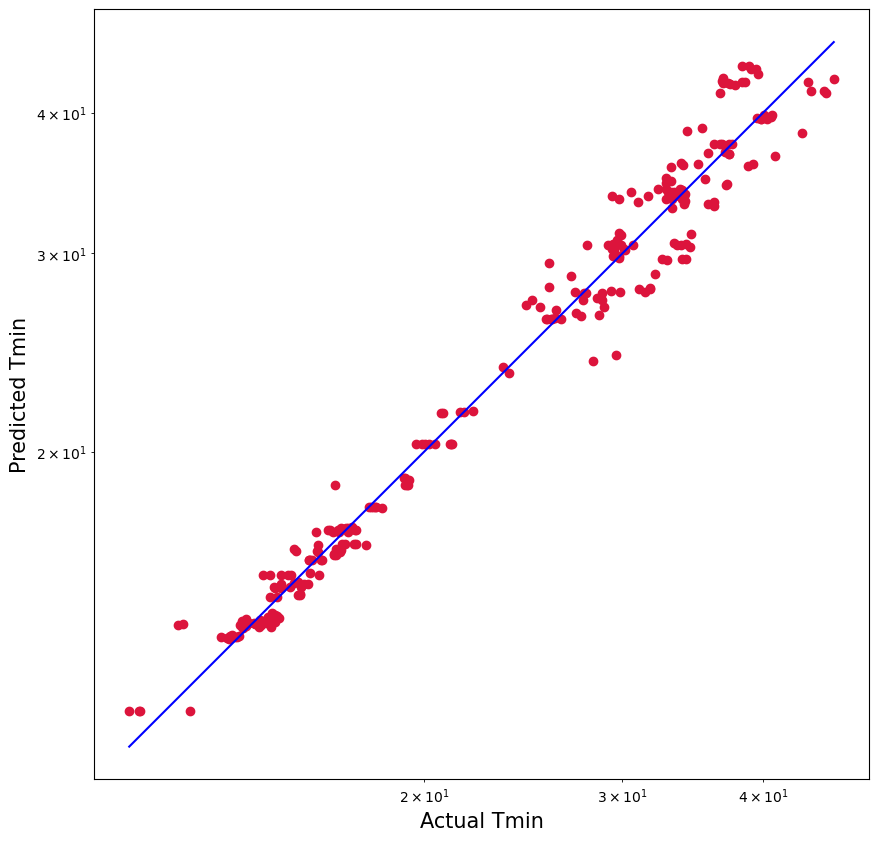

In [59]:
plt.figure(figsize=(10,10))
plt.scatter(y2_test, Predicted, c='crimson')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(Predicted), max(y2_test))
p2 = min(min(Predicted), min(y2_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual Tmin', fontsize=15)
plt.ylabel('Predicted Tmin', fontsize=15)
plt.axis('equal')
plt.show()

# Final Model(Gaurav_Birari)